In [14]:
# Import Modules 

import pandas as pd
import numpy as np 
import seaborn as sns
import matplotlib.pyplot as plt
from ast import literal_eval

!pip install plotly.express
import plotly.express as px
# Data Visualisation
import matplotlib.pyplot as plt
import seaborn as sns

# Pipeline and Column Transformers
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer, make_column_selector
from sklearn import set_config
set_config(display = "diagram")

# Scaling
from sklearn.preprocessing import RobustScaler, StandardScaler, MinMaxScaler

# Cross Validation
from sklearn.model_selection import cross_validate
from sklearn.model_selection import cross_val_predict

# Unsupervised Learning
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans 

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.6/9.6 MB 1.1 MB/s eta 0:00:0000:0100:010m
  Using cached patsy-0.5.2-py2.py3-none-any.whl (233 kB)
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 15.2/15.2 MB 1.3 MB/s eta 0:00:0000:0100:01m
  Using cached tenacity-8.0.1-py3-none-any.whl (24 kB)


In [2]:
# Loading Dataset

%load_ext autoreload
%autoreload 2

data = pd.read_csv("../raw_data/Recipes_incl_pre_time.csv")

data.Relabelled_Ingredients = data.Relabelled_Ingredients.apply(literal_eval)
data['Instructions'] = data.Instructions.apply(str)
data = data.drop(columns=['Unnamed: 0.1'])

In [3]:
#Creating metrics

data['number_of_ingredients'] = data.apply(lambda x: len(x['Relabelled_Ingredients']), axis = 1 )
data['length_of_instructions'] = data.apply(lambda x: len(x['Instructions']), axis = 1 )



In [7]:
X = data[['Prep Time','number_of_ingredients','length_of_instructions']]

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7873 entries, 0 to 7872
Data columns (total 3 columns):
 #   Column                  Non-Null Count  Dtype
---  ------                  --------------  -----
 0   Prep Time               7873 non-null   int64
 1   number_of_ingredients   7873 non-null   int64
 2   length_of_instructions  7873 non-null   int64
dtypes: int64(3)
memory usage: 184.6 KB


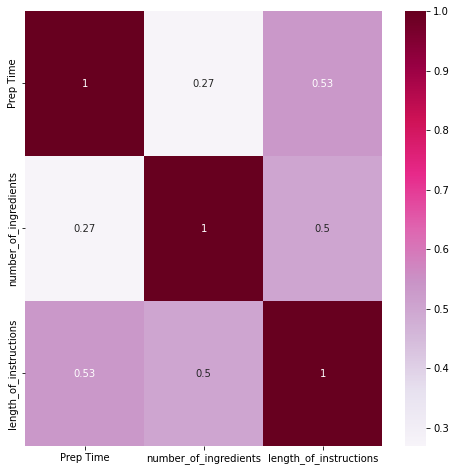

In [12]:
X.info()

plt.figure(figsize=(8,8))

sns.heatmap(X.corr(),
            annot = True,
            annot_kws = {"fontsize":10},
            cmap='PuRd');

In [16]:
fig = px.scatter_3d(X, 
                    x = 'Prep Time',
                    y = 'number_of_ingredients',
                    z = 'length_of_instructions',
                    opacity=0.7, width=500, height=500
           )
fig.show()

In [18]:
kmeans_vanilla = KMeans(n_clusters = 5)
kmeans_vanilla.fit(X)
 
labels_vanilla = kmeans_vanilla.labels_
labels_vanilla


array([2, 1, 2, ..., 1, 1, 0], dtype=int32)

In [21]:
fig = px.scatter_3d(X, 
                    x = 'Prep Time',
                    y = 'number_of_ingredients',
                    z = 'length_of_instructions', color = labels_vanilla, width=500, height=500
           )
fig.show()

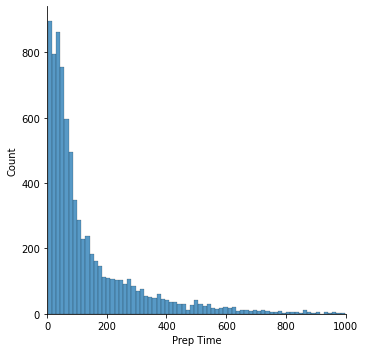

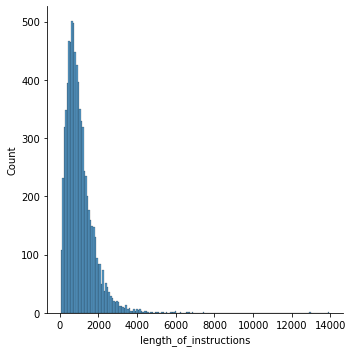

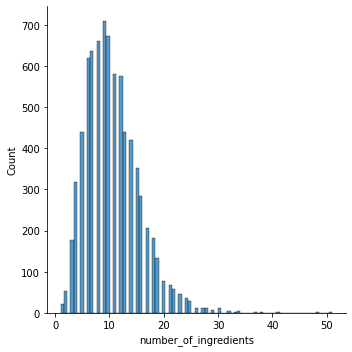

In [46]:
sns.displot(X['Prep Time'])
plt.xlim(0,1000)
plt.show()
sns.displot(X['length_of_instructions'])
plt.show()
sns.displot(X['number_of_ingredients'])
plt.show()

## Scaling

In [23]:
scaler = RobustScaler()
X_scaled = pd.DataFrame(scaler.fit_transform(X), columns=X.columns)
X_scaled

,Prep Time,number_of_ingredients,length_of_instructions
0,-0.278571,-0.500000,-0.319549
1,-0.207143,0.000000,-0.007519
2,-0.435714,-0.666667,-0.745614
3,-0.371429,-1.000000,-0.644110
4,-0.307143,-0.500000,-0.289474
...,...,...,...
7868,-0.128571,0.833333,1.002506
7869,-0.135714,0.500000,-0.228070
7870,-0.185714,-0.500000,-0.013784
7871,-0.014286,-0.666667,0.542607


In [55]:
kmeans_vanilla2 = KMeans(n_clusters = 5)
kmeans_vanilla2.fit(X_scaled)
 
labels_vanilla2 = kmeans_vanilla2.labels_
labels_vanilla2


array([3, 3, 3, ..., 3, 3, 4], dtype=int32)

In [58]:
fig = px.scatter_3d(X, 
                    x = 'Prep Time',
                    y = 'number_of_ingredients',
                    z = 'length_of_instructions', color = labels_vanilla2, width=500, height=500
           )
fig.show()

## PCA

In [60]:
pca = PCA()
pca.fit(X_scaled) # find all the Principal Components PC (no y!)

PCA()

In [61]:
threhsold_pca = 3
pca = PCA(n_components=threhsold_pca, whiten=True)
pca.fit(X_scaled)
X_proj = pd.DataFrame(pca.transform(X_scaled))
X_proj

,0,1,2
0,-0.724780,0.305647,0.305140
1,-0.480874,-0.231294,0.107930
2,-0.989367,0.578035,0.021172
3,-0.984789,0.835967,0.494693
4,-0.730325,0.271020,0.352823
...,...,...,...
7868,0.070071,-1.421956,0.400413
7869,-0.418265,-0.474535,-0.748350
7870,-0.569400,0.195663,0.649512
7871,-0.318044,0.133739,1.460983


In [62]:
fig_scaled = px.scatter_3d(X_proj, x = 0, y = 1, z = 2, opacity=0.7, width=500, height=500)
fig_scaled.show()

In [64]:
kmeans_pca = KMeans(n_clusters = 5)
kmeans_pca.fit(X_proj)
labels_kmeans_pca = kmeans_pca.labels_
labels_kmeans_pca

array([2, 2, 2, ..., 2, 0, 0], dtype=int32)

In [67]:
fig_scaled = px.scatter_3d(X_proj,
                           x = 0, 
                           y = 1,
                           z = 2,
                           color = labels_kmeans_pca,
                          width=500, height=500)
fig_scaled.show()

In [68]:
fig = px.scatter_3d(X, 
                    x = 'Prep Time',
                    y = 'number_of_ingredients',
                    z = 'length_of_instructions', color = labels_kmeans_pca, width=500, height=500
           )
fig.show()

## Ideal Numbers of Clusters

In [70]:
nb_clusters_to_try = np.arange(1,20+1,1)
nb_clusters_to_try

# Apply the elbow method to find the optimal number of clusters.

wcss = []

for K in nb_clusters_to_try:
    print('working with ' + str(K) + ' clusters...', flush=True)
    kmeans = KMeans(n_clusters = K)
    kmeans.fit(X_proj)
    wcss.append(kmeans.inertia_)
print("DONE !")

working with 1 clusters...
working with 2 clusters...
working with 3 clusters...
working with 4 clusters...
working with 5 clusters...
working with 6 clusters...
working with 7 clusters...
working with 8 clusters...
working with 9 clusters...
working with 10 clusters...
working with 11 clusters...
working with 12 clusters...
working with 13 clusters...
working with 14 clusters...
working with 15 clusters...
working with 16 clusters...
working with 17 clusters...
working with 18 clusters...
working with 19 clusters...
working with 20 clusters...
DONE !


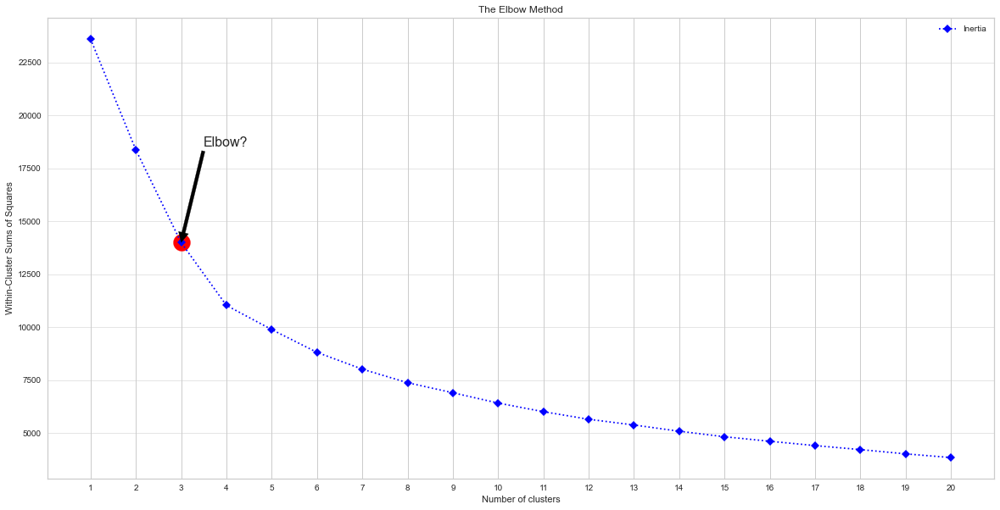

In [78]:
elbow_highlight = 3
with plt.style.context('seaborn-deep'):
    # figsize
    plt.figure(figsize=(20,10))
    # getting axes
    ax = plt.gca()
    # plotting
    ax.plot(nb_clusters_to_try, wcss,color="blue",linestyle=":",marker="D",label="Inertia")
    # customizing
    ax.legend(loc="upper right")
    ax.set_title('The Elbow Method')
    ax.set_xticks(nb_clusters_to_try)
    ax.set_xlabel('Number of clusters')
    ax.set_ylabel('Within-Cluster Sums of Squares')
    ax.scatter(elbow_highlight,wcss[elbow_highlight-1],c='red',s=400)    
    # annotate
    ax.annotate("Elbow?", 
                (elbow_highlight,wcss[elbow_highlight-1]),
                (elbow_highlight+0.50,wcss[elbow_highlight-1]+5000), 
                arrowprops=dict(facecolor='black'),
                fontsize=16,
#                horizontalalignment='middle', 
                verticalalignment='top')
    
    ax.grid(axis="y",linewidth=0.5)
    plt.show()

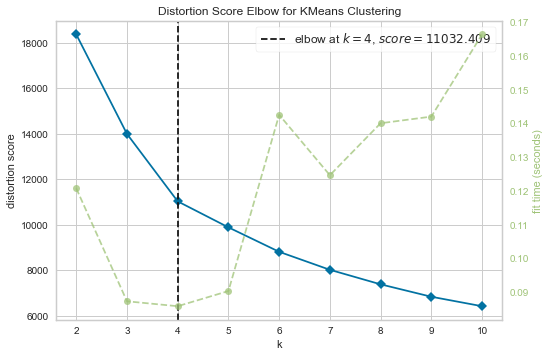

In [77]:
!pip install yellowbrick
!pip install --upgrade yellowbrick
from yellowbrick.cluster import KElbowVisualizer


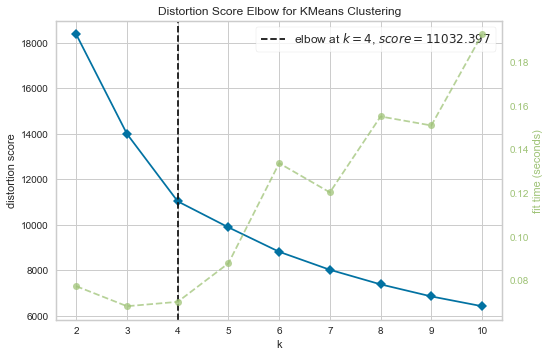

In [79]:

kmeans = KMeans()
elbow_visualizer = KElbowVisualizer(kmeans, n_clusters = (1,21))
elbow_visualizer.fit(X_proj)
elbow_visualizer.show();

## Final Clustering and Merge

In [80]:
recipes_clusters = 4

print('Working with ' + str(recipes_clusters) + ' clusters', flush=True)
print("-"*80)

kmeans = KMeans(n_clusters = recipes_clusters, max_iter = 300)

kmeans.fit(X_proj)

labelling = kmeans.labels_

fig_scaled = px.scatter_3d(X_proj,
                           x = 0,
                           y = 1,
                           z = 2,
                           color=labelling, width=500, height=500)
fig_scaled.show()

Working with 4 clusters
--------------------------------------------------------------------------------


In [81]:
X_labelled = pd.concat([X,pd.Series(labelling)],axis=1).rename(columns={0:"label"})
X_labelled

,Prep Time,number_of_ingredients,length_of_instructions,label
0,34,7,613,2
1,44,10,862,2
2,12,6,273,2
3,21,4,354,2
4,30,7,637,2
...,...,...,...,...
7868,55,15,1668,1
7869,54,13,686,1
7870,47,7,857,2
7871,71,6,1301,2


In [94]:
X_labelled['label'].value_counts()

2    4160
1    2231
0     834
3     648
Name: label, dtype: int64

In [95]:
X_labelled.groupby(by="label", dropna=False).mean()

,Prep Time,number_of_ingredients,length_of_instructions
label,,,
0,211.105516,12.056355,2356.086331
1,122.175258,15.726580,1158.867772
2,70.158894,7.506010,657.565625
3,578.679012,11.594136,1337.748457
